Feature engineering 


1.Feature selection
Removing uninformative features

2.Feature extraction
Creating new features from existing features

3.Feature transformation
Modifying existing features to better suit our objectives
Encoding of categorical features as dummies

# Import packages and libraries

In [1]:
import numpy as np
import pandas as pd

In [4]:
# Read in data
df = pd.read_csv('Churn_df.csv')


# EDA - Understanding data 

Data analysis without EDA? Like building a house without blueprints! ️

Exploratory Data Analysis (EDA) is the Sherlock Holmes of Data Science, unraveling mysteries within datasets to uncover hidden insights. This crucial phase involves visualizing, summarizing, and understanding the underlying structure of data. By leveraging statistical profiling, correlation analysis, and visualization techniques, EDA transforms raw data into a narrative, guiding data scientists through the intricate tapestry of patterns and anomalies.

In [5]:
df.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Loyalty,Geography_Germany,Geography_Spain
0,619,42,2,0.00,1,1,1,101348.88,1,0.047619,0,0
1,608,41,1,83807.86,1,0,1,112542.58,0,0.024390,0,1
2,502,42,8,159660.80,3,1,0,113931.57,1,0.190476,0,0
3,699,39,1,0.00,2,0,0,93826.63,0,0.025641,0,0
4,850,43,2,125510.82,1,1,1,79084.10,0,0.046512,0,1


In [6]:
# Display number of rows, number of columns - To check how large the data is 
df.shape

(10000, 12)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CreditScore        10000 non-null  int64  
 1   Age                10000 non-null  int64  
 2   Tenure             10000 non-null  int64  
 3   Balance            10000 non-null  float64
 4   NumOfProducts      10000 non-null  int64  
 5   HasCrCard          10000 non-null  int64  
 6   IsActiveMember     10000 non-null  int64  
 7   EstimatedSalary    10000 non-null  float64
 8   Exited             10000 non-null  int64  
 9   Loyalty            10000 non-null  float64
 10  Geography_Germany  10000 non-null  int64  
 11  Geography_Spain    10000 non-null  int64  
dtypes: float64(3), int64(9)
memory usage: 937.6 KB


In [8]:
#Show Key Statistics
#it helps calculate mean , median , mode , min , max 
df.describe()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Loyalty,Geography_Germany,Geography_Spain
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,650.528800,38.921800,5.012800,76485.889288,1.530200,0.70550,0.515100,100090.239881,0.203700,0.137936,0.250900,0.247700
std,96.653299,10.487806,2.892174,62397.405202,0.581654,0.45584,0.499797,57510.492818,0.402769,0.089506,0.433553,0.431698
min,350.000000,18.000000,0.000000,0.000000,1.000000,0.00000,0.000000,11.580000,0.000000,0.000000,0.000000,0.000000
25%,584.000000,32.000000,3.000000,0.000000,1.000000,0.00000,0.000000,51002.110000,0.000000,0.064516,0.000000,0.000000
50%,652.000000,37.000000,5.000000,97198.540000,1.000000,1.00000,1.000000,100193.915000,0.000000,0.129032,0.000000,0.000000
75%,718.000000,44.000000,7.000000,127644.240000,2.000000,1.00000,1.000000,149388.247500,0.000000,0.200000,1.000000,0.000000
max,850.000000,92.000000,10.000000,250898.090000,4.000000,1.00000,1.000000,199992.480000,1.000000,0.555556,1.000000,1.000000


In [9]:
# Check the columns in the DataFrame
#To know what are the columsn we have in the dataset
columns_list = df.columns
columns_list

Index(['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited', 'Loyalty',
       'Geography_Germany', 'Geography_Spain'],
      dtype='object')

In [10]:
# Data Types for our columns

print(df.dtypes)

CreditScore            int64
Age                    int64
Tenure                 int64
Balance              float64
NumOfProducts          int64
HasCrCard              int64
IsActiveMember         int64
EstimatedSalary      float64
Exited                 int64
Loyalty              float64
Geography_Germany      int64
Geography_Spain        int64
dtype: object


# EDA - Checking missing values 

In [11]:
# Check in for missing data 
# Using loop to check the missing data 


for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

CreditScore - 0%
Age - 0%
Tenure - 0%
Balance - 0%
NumOfProducts - 0%
HasCrCard - 0%
IsActiveMember - 0%
EstimatedSalary - 0%
Exited - 0%
Loyalty - 0%
Geography_Germany - 0%
Geography_Spain - 0%


All good no missing data 

# EDA - Visualizing data 

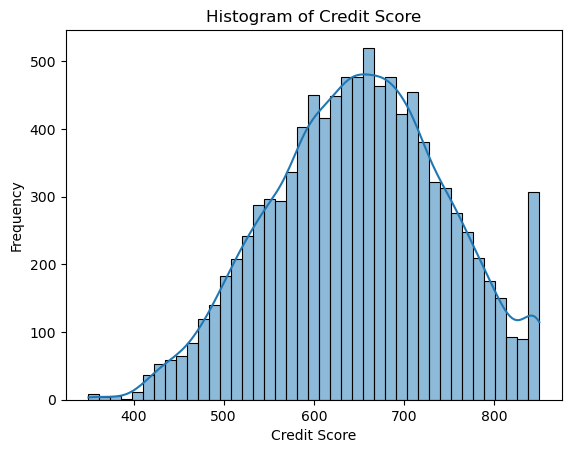

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

# Histogram for numerical variable (e.g., 'CreditScore')
sns.histplot(df['CreditScore'], kde=True)
plt.title('Histogram of Credit Score')
plt.xlabel('Credit Score')
plt.ylabel('Frequency')
plt.show()



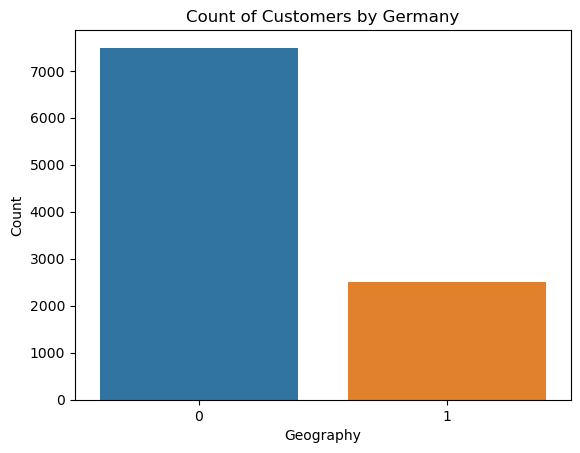

In [18]:
# Bar plot for categorical variable (e.g., 'Geography')
sns.countplot(data=df, x='Geography_Germany')
plt.title('Count of Customers by Germany')
plt.xlabel('Geography')
plt.ylabel('Count')
plt.show()


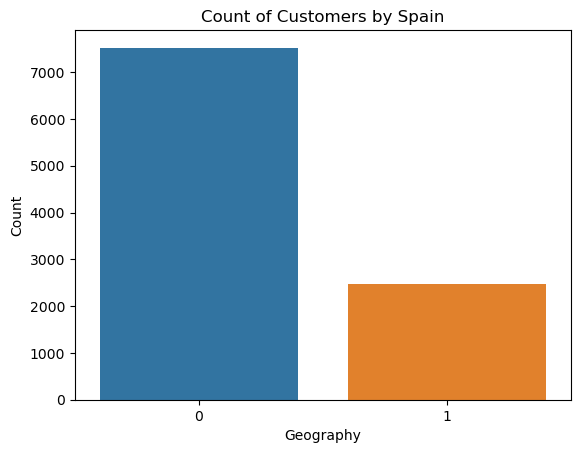

In [19]:
# Bar plot for categorical variable (e.g., 'Geography')
sns.countplot(data=df, x='Geography_Spain')
plt.title('Count of Customers by Spain')
plt.xlabel('Geography')
plt.ylabel('Count')
plt.show()

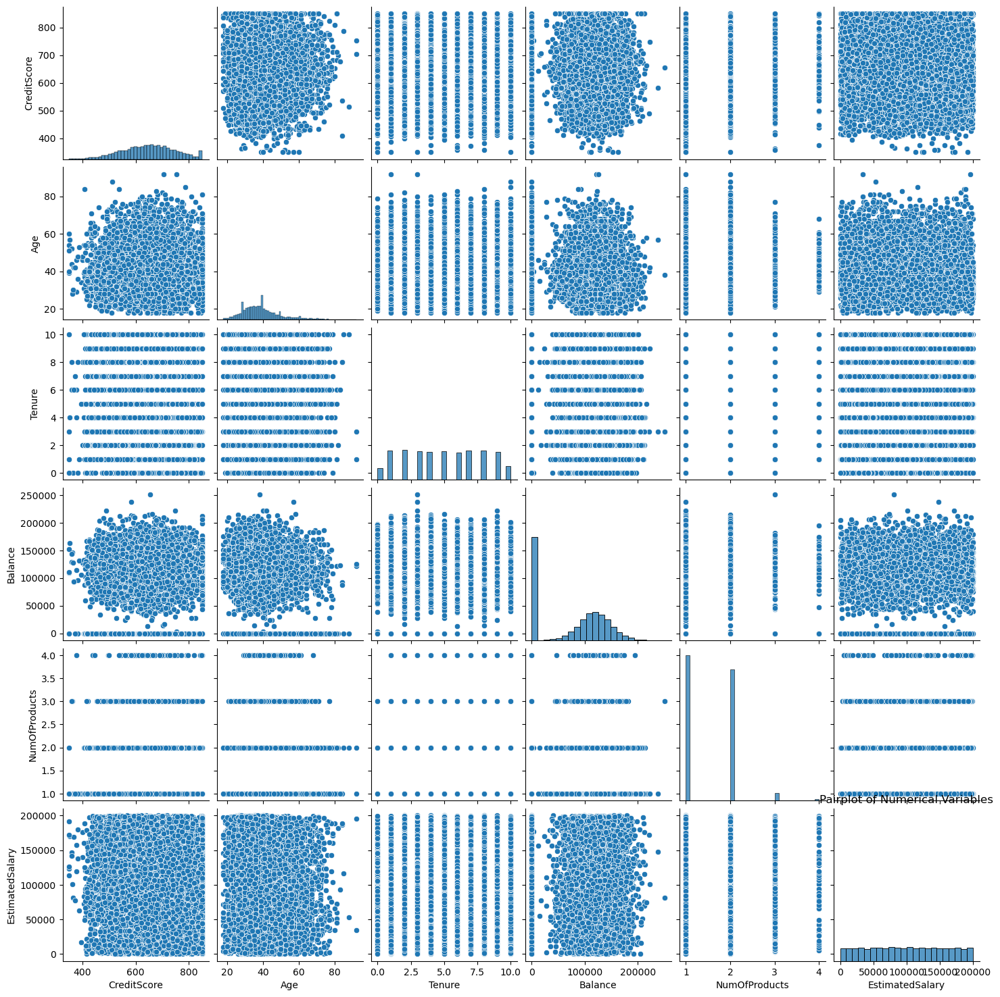

In [15]:

# Pairplot for exploring relationships (numerical variables only)
numerical_columns = ['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'EstimatedSalary']
sns.pairplot(df[numerical_columns])
plt.title('Pairplot of Numerical Variables')
plt.show()

# EDA - Data Transformation 

1.Log transformation - Here log transformation is not necessary as the histogram shows a normal distribuition.



2.Scaling/Normalization



3.Encoding categorical variables: 

# EDA - Data Correlation

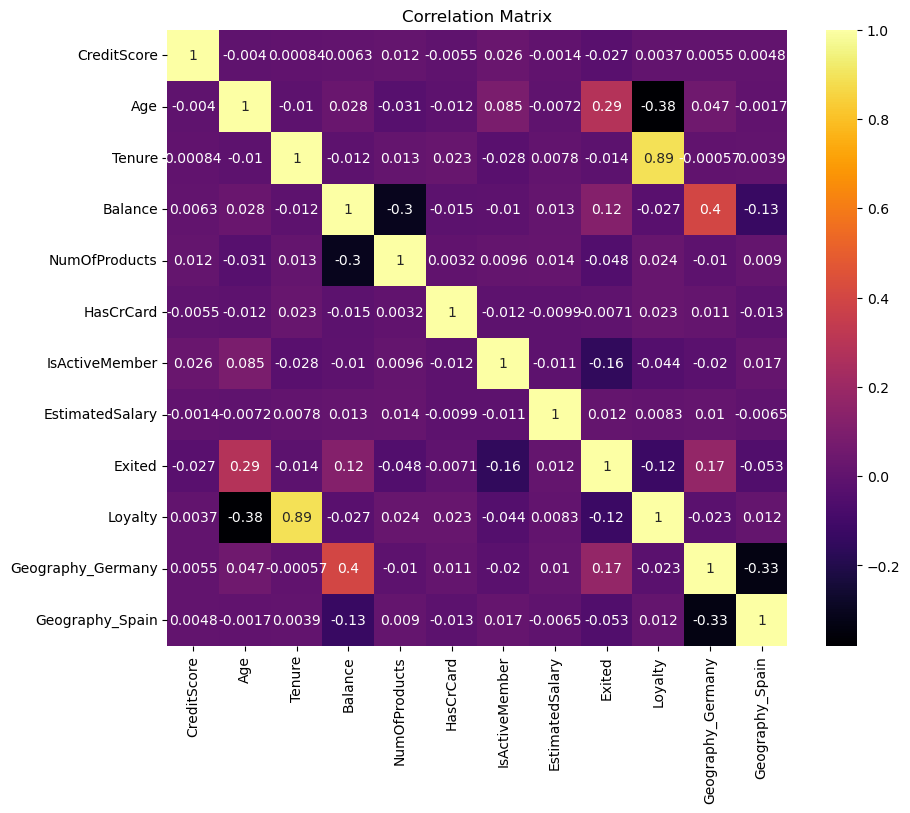

                   CreditScore       Age    Tenure   Balance  NumOfProducts  \
CreditScore           1.000000 -0.003965  0.000842  0.006268       0.012238   
Age                  -0.003965  1.000000 -0.009997  0.028308      -0.030680   
Tenure                0.000842 -0.009997  1.000000 -0.012254       0.013444   
Balance               0.006268  0.028308 -0.012254  1.000000      -0.304180   
NumOfProducts         0.012238 -0.030680  0.013444 -0.304180       1.000000   
HasCrCard            -0.005458 -0.011721  0.022583 -0.014858       0.003183   
IsActiveMember        0.025651  0.085472 -0.028362 -0.010084       0.009612   
EstimatedSalary      -0.001384 -0.007201  0.007784  0.012797       0.014204   
Exited               -0.027094  0.285323 -0.014001  0.118533      -0.047820   
Loyalty               0.003732 -0.379205  0.888362 -0.027338       0.023576   
Geography_Germany     0.005538  0.046897 -0.000567  0.401110      -0.010419   
Geography_Spain       0.004780 -0.001685  0.003868 -

In [14]:

# Correlation matrix
correlation_matrix = df.corr()

# Heatmap of correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='inferno')
plt.title('Correlation Matrix')
plt.show()

# Display the correlation matrix
print(correlation_matrix)

# EDA - Checking Data Outliers

Checking outliers for **Credit score** 

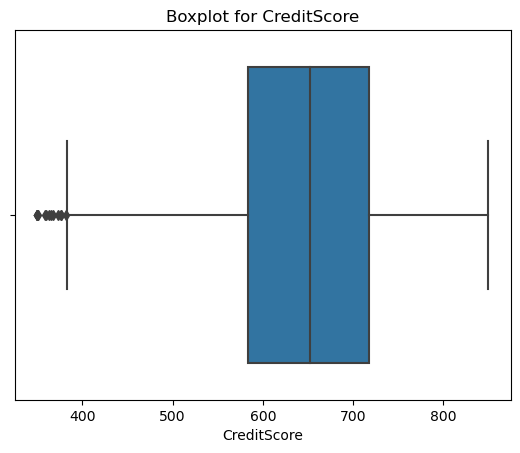

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

# Boxplot for outlier detection
sns.boxplot(data=df, x='CreditScore')
plt.title('Boxplot for CreditScore')
plt.show()

# Outlier treatment
Q1 = df['CreditScore'].quantile(0.25)
Q3 = df['CreditScore'].quantile(0.75)
IQR = Q3 - Q1
df = df[(df['CreditScore'] >= Q1 - 1.5 * IQR) & (df['CreditScore'] <= Q3 + 1.5 * IQR)]

In [21]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = df['CreditScore'].quantile(0.25)
Q3 = df['CreditScore'].quantile(0.75)

# Calculate IQR (Interquartile Range)
IQR = Q3 - Q1

# Define lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Find outliers
outliers = df[(df['CreditScore'] < lower_bound) | (df['CreditScore'] > upper_bound)]

print("Outliers:")
print(outliers)

Outliers:
Empty DataFrame
Columns: [CreditScore, Age, Tenure, Balance, NumOfProducts, HasCrCard, IsActiveMember, EstimatedSalary, Exited, Loyalty, Geography_Germany, Geography_Spain]
Index: []


Checking outliers for **EstimatedSalary**

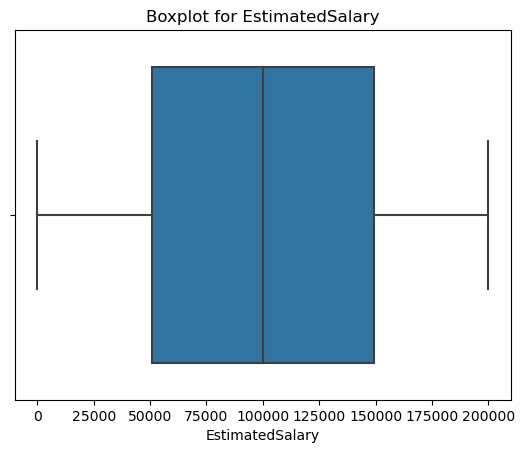

In [22]:
# Boxplot for outlier detection
sns.boxplot(data=df, x='EstimatedSalary')
plt.title('Boxplot for EstimatedSalary')
plt.show()

# Outlier treatment
Q1 = df['EstimatedSalary'].quantile(0.25)
Q3 = df['EstimatedSalary'].quantile(0.75)
IQR = Q3 - Q1
df = df[(df['EstimatedSalary'] >= Q1 - 1.5 * IQR) & (df['EstimatedSalary'] <= Q3 + 1.5 * IQR)]

In [23]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = df['EstimatedSalary'].quantile(0.25)
Q3 = df['EstimatedSalary'].quantile(0.75)

# Calculate IQR (Interquartile Range)
IQR = Q3 - Q1

# Define lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Find outliers
outliers = df[(df['EstimatedSalary'] < lower_bound) | (df['EstimatedSalary'] > upper_bound)]

print("Outliers:")
print(outliers)

Outliers:
Empty DataFrame
Columns: [CreditScore, Age, Tenure, Balance, NumOfProducts, HasCrCard, IsActiveMember, EstimatedSalary, Exited, Loyalty, Geography_Germany, Geography_Spain]
Index: []


Checking outliers for **Balance**


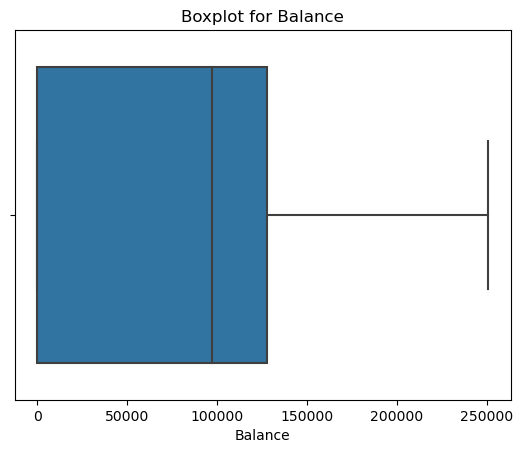

In [24]:
# Boxplot for outlier detection
sns.boxplot(data=df, x='Balance')
plt.title('Boxplot for Balance')
plt.show()

# Outlier treatment
Q1 = df['Balance'].quantile(0.25)
Q3 = df['Balance'].quantile(0.75)
IQR = Q3 - Q1
df = df[(df['Balance'] >= Q1 - 1.5 * IQR) & (df['Balance'] <= Q3 + 1.5 * IQR)]

In [ ]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = df['Balance'].quantile(0.25)
Q3 = df['Balance'].quantile(0.75)

# Calculate IQR (Interquartile Range)
IQR = Q3 - Q1

# Define lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Find outliers
outliers = df[(df['Balance'] < lower_bound) | (df['Balance'] > upper_bound)]

print("Outliers:")
print(outliers)

# EDA - Pairplot

There are no outliers in any of the column i suspected 

Pairplot 

If the points form a linear pattern, it indicates a strong correlation between the variables.


If the points are scattered randomly, it suggests no correlation between the variables.


If the points form clusters or patterns, it may indicate nonlinear relationships or the presence of groups within the data.

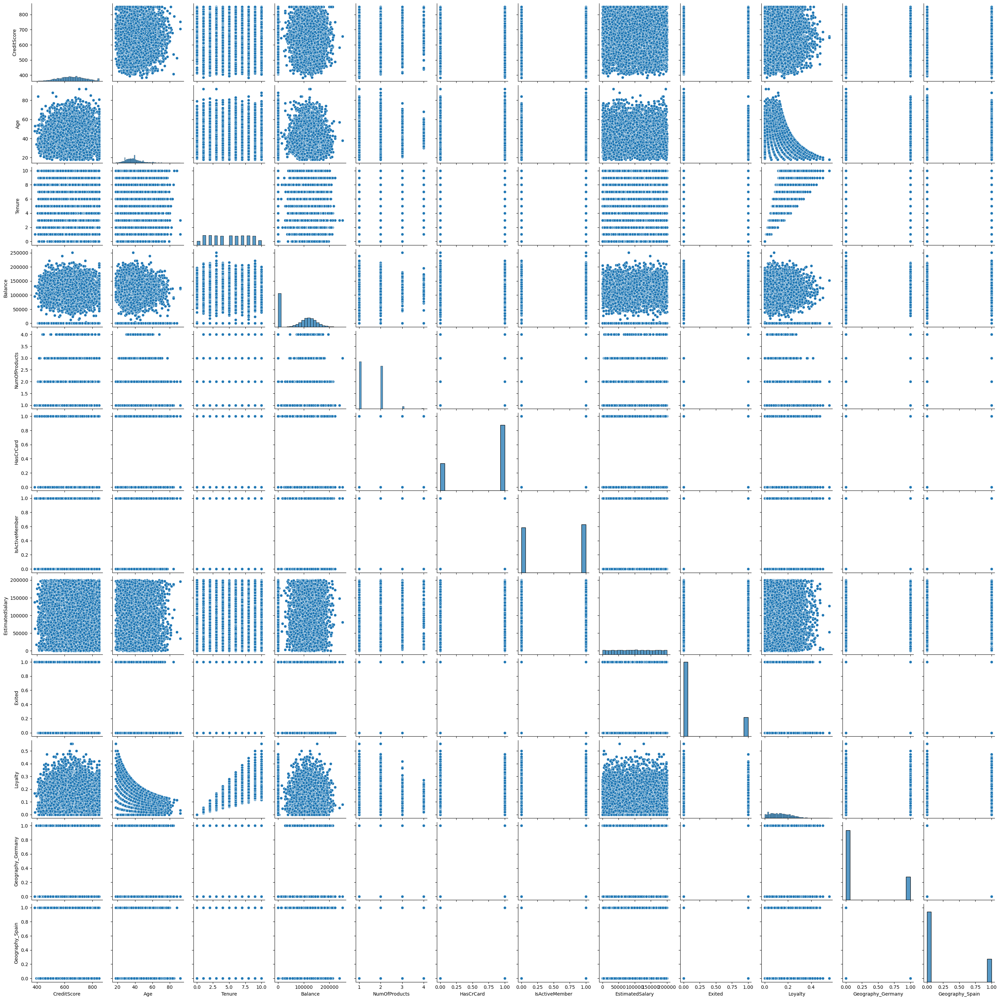

In [25]:
# Pairplot - A pair plot is a powerful visualization tool used in exploratory data analysis (EDA) to understand the relationships between different pairs of variables in a dataset. 




sns.pairplot(df)

plt.show()




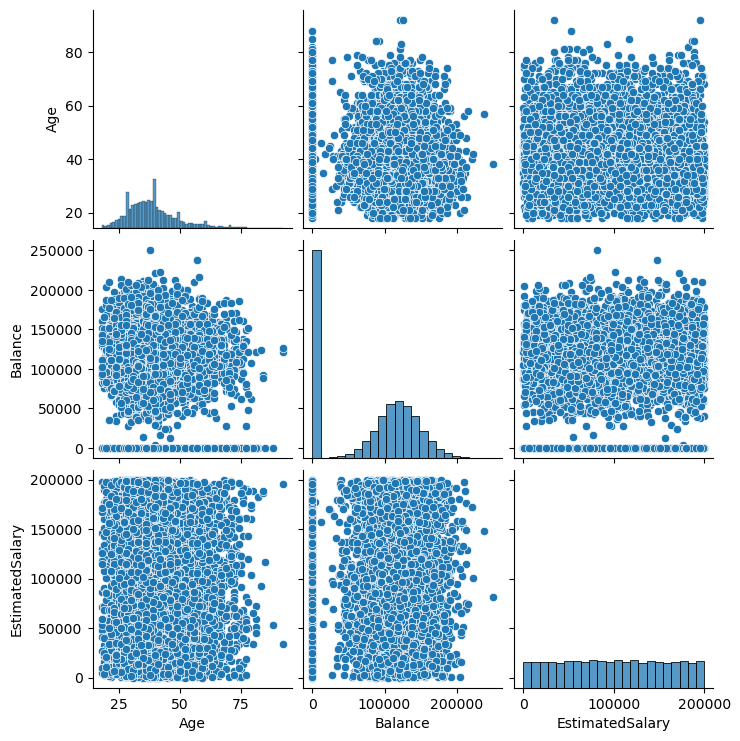

In [26]:
subset_vars = ['Age', 'Balance', 'EstimatedSalary']

# Plotting pairplot for the subset of variables
sns.pairplot(df[subset_vars])
plt.show()

#Here Age = Heavily right skewed 


Interpreting AGE - Right skewed - Positively distributed 


One tails is distributed more than the other 

Positively distributed means = Mode <meadian < mean






1. Means most individuals in the dataset are younger 






2. As the distribution moves towards higher ages, the number of individuals decreases rapidly. 
This means that there are fewer older individuals compared to younger ones.








3. Potential Outliers - The right tail of the distribution may contain some extreme values, which could represent outliers. 
These outliers are individuals whose ages are much higher than the typical age in the dataset.








4. Effect on analysis: The right-skewed age distribution can affect statistical analysis and modeling.
    For example, certain models may assume that data is normally distributed,
    so the skewed distribution may violate this assumption.
    Additionally, outliers in the older age range might disproportionately influence results,
    so it's essential to consider their impact carefully.
    
    
    
    
    
    
    
    
5. Consider transformations: Depending on the analysis, it might be beneficial to transform the age variable to reduce skewness and make it more normally distributed.
    Techniques like log transformation or binning can help mitigate the effects of skewness.


# Perform Log transformation



Why did i choose log transformation ?


Age variable can help in reducing the right skewness observed in the original distribution of ages. When using log transformation.

Log transformation can make the distribution of ages more symmetrical, which is helpful for many statistical techniques that assume normality in the data.

 Log-transformed variables can sometimes improve the performance of certain models by reducing the impact of extreme values and making the relationship with the target variable more linear.

In [27]:
# Log transformation


df['Log_Age'] = np.log(df['Age'])
df

# Since i transformed the age to log , we dont need the age column anymore , so we can drop that to avaoid confusion.

# Drop the non-transformed columns
df = df.drop(columns = ['Age'])

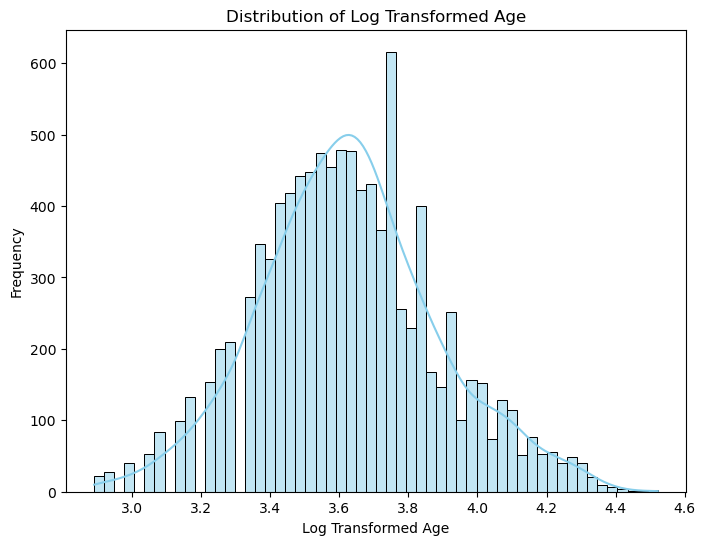

In [28]:
# Set up the figure and axis
plt.figure(figsize=(8, 6))

# Plot the histogram of log-transformed age
sns.histplot(data=df, x='Log_Age', kde=True, color='skyblue')

# Add labels and title
plt.xlabel('Log Transformed Age')
plt.ylabel('Frequency')
plt.title('Distribution of Log Transformed Age')

# Show the plot
plt.show()

So here now after taking the log of age and interpreting the distribuition it seems that the data is more symmetrical

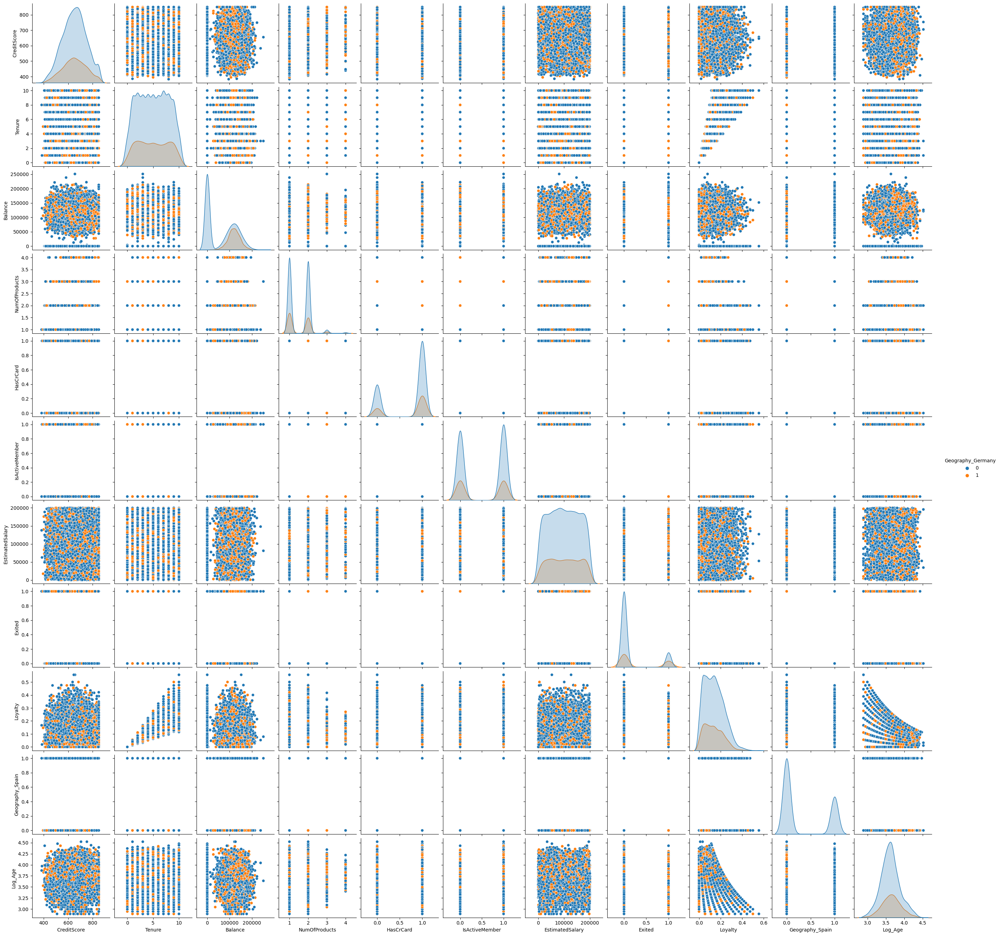

In [32]:
sns.pairplot(df, hue = 'Geography_Germany')
plt.show()

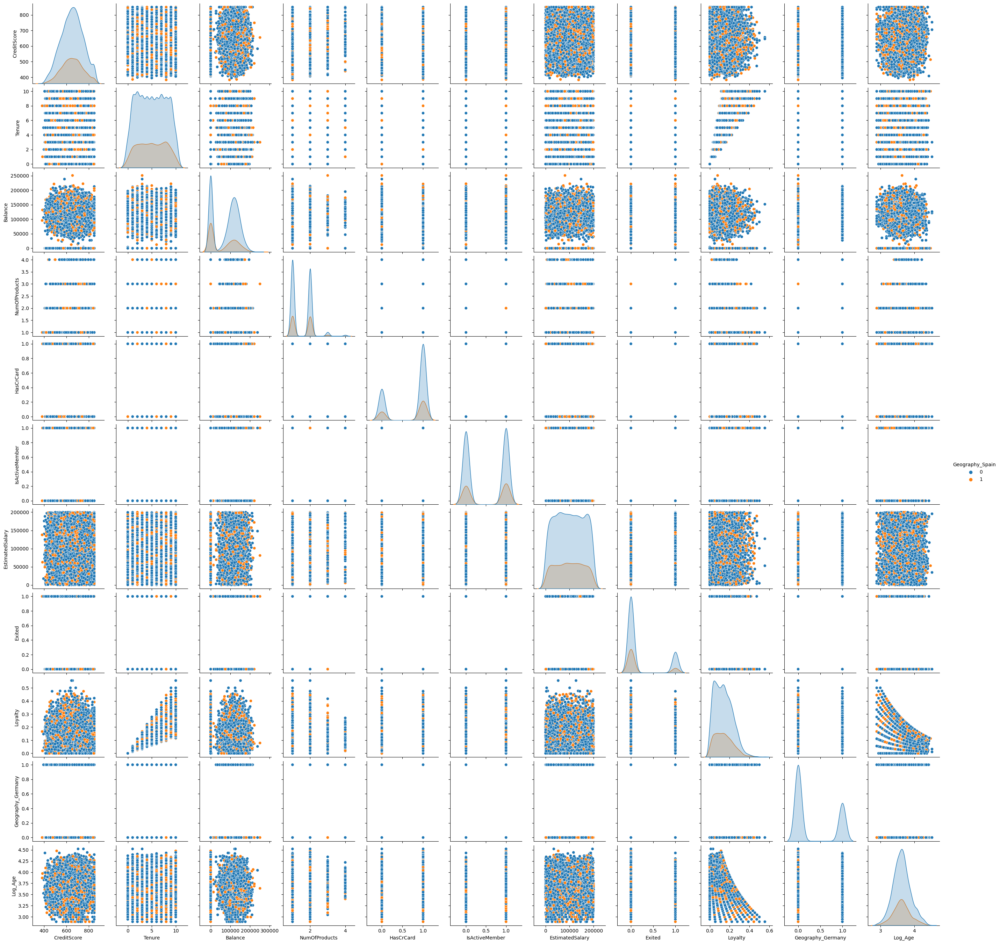

In [33]:
sns.pairplot(df, hue = 'Geography_Spain')
plt.show()

# Applying feature engineering 





Feature selection is the process of choosing features to be used for modeling. In practice, feature selection takes place at multiple points in the PACE process.



Steps I followed during feature engineering


PLAN :

1. I Consider what data was available to me
2. Decide on what kind of model I need
3. Decide on a target variable
4. Assembling a collection of features that I think might help predict on your chosen target


Then, during the **Analyze** phase, I perform EDA on the data and reevaluate my  variables for appropriateness. For example, I  my  model handle null values? If not, what do I do with features with a lot of nulls? Perhaps I drop them. This too is feature selection.

Feature selection also occurs during the **Construct** phase. This usually involves building a model, examining which features are most predictive, and then removing the unpredictive features.

There's a lot of work involved in feature selection. In this case, we already have a dataset, and we are not performing thorough EDA on it. However, we can still examine the data to ensure that all the features can reasonably be expected to have predictive potential. 

**Performing feature selection by removing unnessasary column from the dataset**




In [39]:
df.head()

,CreditScore,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Loyalty,Geography_Germany,Geography_Spain,Log_Age
0,619,2,0.00,1,1,1,101348.88,1,0.047619,0,0,3.737670
1,608,1,83807.86,1,0,1,112542.58,0,0.024390,0,1,3.713572
2,502,8,159660.80,3,1,0,113931.57,1,0.190476,0,0,3.737670
3,699,1,0.00,2,0,0,93826.63,0,0.025641,0,0,3.663562
4,850,2,125510.82,1,1,1,79084.10,0,0.046512,0,1,3.761200


Depending on your data, you may be able to create brand new features from your existing features. Oftentimes, features that you create yourself are some of the most important features selected by your model. Usually this is the case when you have both domain knowledge for the problem you're solving and the right combinations of data. 

For example, suppose you knew that your bank had a computer glitch that caused many credit card transactions to be mistakenly declined in October. It would be reasonable to suspect that people who experienced this might be at increased risk of leaving the bank. If you had a feature that represented each customer's number of credit card transactions each month, you could create a new feature; for example, `OctUseRatio`, where:

$$\text{OctUseRatio} = \frac{\text{num of Oct. transactions}}{\text{avg num monthly transactions}}$$
  </br> 

This new feature would then give you a ratio that might be indicative of whether the customer experienced declined transactions. 

We don't have this kind of specific circumstantial knowledge, and we don't have many features to choose from, but we can create a new feature that might help improve the model.


Let's create a `Loyalty` feature that represents the percentage of each customer's life that they were customers. We can do this by dividing `Tenure` by `Age`:

$$\text{Loyalty} = \frac{\text{Tenure}}{\text{Age}}$$
  </br> 
The intuition here is that people who have been customers for a greater proportion of their lives might be less likely to churn. 

The next step is to transform my features to get them ready for modeling. Different models have different requirements for how the data should be prepared and also different assumptions about their distributions, independence, and so on. You learned about some of these already for linear and logistic regression, and you will continue learning about them as you encounter new modeling techniques.

The models we I will  be building with this data are all classification models, and **classification models generally need categorical variables to be encoded**. My dataset has one categorical feature: `Geography`. 

In [47]:
#Encoding my categorical variable 


# Print unique values of Geography col
df['Geography_Germany'].unique()
df['Geography_Spain'].unique()

array([0, 1], dtype=int64)

There are three unique values: France, Spain, and Germany. Encode this data so it can be represented using Boolean features. We will use a pandas function called `pd.get_dummies()` to do this.

When we call `pd.get_dummies()` on this feature, it will replace the `Geography` column with three new Boolean columns--one for each possible category contained in the column being dummied. 

When we specify `drop_first=True` in the function call, it means that instead of replacing `Geography` with three new columns, it will instead replace it with two columns. We can do this because no information is lost from this, but the dataset is shorter and simpler.  

In this case, we end up with two new columns called `Geography_Germany` and `Geography_Spain`. We don't need a `Geography_France` column, because if a customer's values in `Geography_Germany` and `Geography_Spain` are both 0, we will know they are from France! 

In [49]:
# Dummy encode categorical variables
df = pd.get_dummies(df, drop_first=True)

In [51]:
df.head()

,CreditScore,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Loyalty,Geography_Germany,Geography_Spain,Log_Age
0,619,2,0.00,1,1,1,101348.88,1,0.047619,0,0,3.737670
1,608,1,83807.86,1,0,1,112542.58,0,0.024390,0,1,3.713572
2,502,8,159660.80,3,1,0,113931.57,1,0.190476,0,0,3.737670
3,699,1,0.00,2,0,0,93826.63,0,0.025641,0,0,3.663562
4,850,2,125510.82,1,1,1,79084.10,0,0.046512,0,1,3.761200



# Building Model 

The modeling objective is to build and test a Naive Bayes model that uses banking data to predict whether a customer will churn.
If a customer churns, it means they left the bank and took their business elsewhere. 
**If we can predict customers who are likely to churn,
we can take measures to retain them before they do. 
These measures could be promotions, discounts, or other incentives to boost customer satisfaction and, therefore, retention.**


**Target variable**



My target variable is Exited. This is a Boolean value that indicates whether or not a customer left the bank.



0 = did not leave.


1 = did leave.


For each customer, our model will predict whether they should have a 0 or a 1 in the Exited column.

In [52]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

**Check the class balance**

Here before building the model I check the class balance for my target variable . If the classes in my target variable are highly imbalanced, meaning one class significantly outnumbers the other(s), it can lead to biased models. In such cases, the model might perform well in predicting the majority class but poorly in predicting the minority class.Class imbalance can affect model performance metrics like accuracy, precision, recall, and F1-score.

In [54]:
# Check class balance
df['Exited'].value_counts()

0    7963
1    2022
Name: Exited, dtype: int64

The class is split roughly 80/20.

1 = did leave has 20%

0- Did not leave has 80%

In other words, ~20% of the people in this dataset churned. This is an unbalanced dataset, but it's not extreme.

Also, remember that the Naive Bayes formula depends on class priors (P(c)) to make predictions. Because of this, performing class balancing (e.g., upsampling or downsampling) would change those terms in a way that would no longer reflect the real-world distribution of the data.

For these reasons, we'll proceed without altering the class balance of our target variable.

**Model design**

This is a classification task, because we are trying to predict on a binary class. Naive Bayes often works well for this kind of task. However, recall that there are several different implementations of the Naive Bayes algorithm in scikit-learn, and each assumes that all of your predictor variables are of a single type (e.g., Gaussian for continuous variables, Bernoulli for binary variables, etc.).

Our data has all different types of predictor variables! one of the first things is that real-world data is never perfect. Sometimes the data breaks the assumptions of your model. 

In this case, if we wanted to build the best possible Naive Bayes model, we'd treat each variable according to their different types and distributions, and then combine each conditional probability to get the final prediction for each observation. That's advanced data science.

we're going to use the GaussianNB classifier. This implementation assumes that all of your variables are continuous and that they have a Gaussian (i.e., normal) distribution. Our data doesn't perfectly adhere to these assumptions, but a **Gaussian model may still yield usable results, even with imperfect data.**

In [62]:
df.columns

Index(['CreditScore', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited', 'Loyalty',
       'Geography_Germany', 'Geography_Spain', 'Log_Age'],
      dtype='object')

In [63]:
#Dropping dependent variable 

# Drop Tenure variable
df =df.drop(['Tenure'], axis=1)
df.head()

,CreditScore,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Loyalty,Geography_Germany,Geography_Spain,Log_Age
0,619,0.00,1,1,1,101348.88,1,0.047619,0,0,3.737670
1,608,83807.86,1,0,1,112542.58,0,0.024390,0,1,3.713572
2,502,159660.80,3,1,0,113931.57,1,0.190476,0,0,3.737670
3,699,0.00,2,0,0,93826.63,0,0.025641,0,0,3.663562
4,850,125510.82,1,1,1,79084.10,0,0.046512,0,1,3.761200


**Splitting the data to train the model**

We've prepared our data and we're ready to model. There's one last step before we can begin. We must split the data into features and target variable, and into training data and test data. We do this using the train_test_split() function. We'll put 25% of the data into our test set, and use the remaining 75% to train the model.

Notice below that we include the argument **stratify=y**. If our master data has a class split of 80/20, stratifying ensures that this proportion is maintained in both the training and test data. =y tells the function that it should use the class ratio found in the y variable (our target).

The less data you have overall, and the greater your class imbalance, the more important it is to stratify when you split the data. If we didn’t stratify, then the function would split the data randomly, and we could get an unlucky split that doesn’t get any of the minority class in the test data, which means we wouldn’t be able to effectively evaluate our model. Worst of all, we might not even realize what went wrong without doing some detective work.

Lastly, we set a random seed so we and others can reproduce our work.

In [64]:
# Define the y (target) variable
y = df['Exited']

# Define the X (predictor) variables
X = df.copy()
X = X.drop('Exited', axis=1)

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, \
                                                    stratify=y, random_state=42)

Why to set random state ?

Setting a random state ensures reproducibility in the train-test split. When i split my dataset into training and testing subsets using train_test_split function, it randomly shuffles the data before splitting. Providing a random state ensures that the data is shuffled in the same way every time you run the code, which helps in obtaining consistent results and facilitates debugging.


# Modeling

**Unscaled data**

Just as with linear and logistic regression, the modeling process will begin with fitting our model to the training data, and then using the model to make predictions on the test data.

Here **Gaussian model** is used. This implementation assumes that all of your variables are continuous and that they have a Gaussian (i.e., normal) distribution. Our data doesn't perfectly adhere to these assumptions, but a Gaussian model may still yield usable results, even with imperfect data.

In [65]:
# Fit the model
gnb = GaussianNB()
gnb.fit(X_train, y_train)

# Get the predictions on test data
y_preds = gnb.predict(X_test)

In [66]:
print('Accuracy:', '%.3f' % accuracy_score(y_test, y_preds))
print('Precision:', '%.3f' % precision_score(y_test, y_preds))
print('Recall:', '%.3f' % recall_score(y_test, y_preds))
print('F1 Score:', '%.3f' % f1_score(y_test, y_preds))

#%.3f - is the floating point for 3 decimal places 

Accuracy: 0.797
Precision: 0.000
Recall: 0.000
F1 Score: 0.000


C:\Users\Owner\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy = 79.7% of the predictions made by the model are correct.




Precision = 0 0.000 indicates that there are no true positive predictions (correctly predicted positive instances) among the positive predictions made by the model.




Recall =  0.000 indicates that the model did not correctly identify any of the actual positive instances in the dataset. It suggests that the model has a high rate of false negatives.




F1 Score =  The F1 score provides a balance between precision and recall. A low F1 score suggests poor performance in both precision and recall.

this isn’t very good. Our precision, recall, and F1 scores are all zero. Well, let’s consider our precision formula: 
</br>  


$$precision = \frac{\text{true positives}}{\text{false positives + true positives}}$$
  </br> 

There are two ways for the model to have a precision of zero. The first is if the numerator is zero, which would mean that our model didn’t predict any true positives. 

The second is if the denominator is also zero, which would mean that our model didn’t predict any positives at all. Dividing by zero results in an undefined value, but scikit-learn will return a value of zero in this case. Depending on your modeling environment, you may get a warning that tells you there’s a denominator of zero. 

We don’t have a warning, so let’s check which situation is occurring here. If we call `np.unique()` on the model's predictions and it doesn't return an array containing `[0, 1]`, we'll know it's not predicticting any churned customers.

In [67]:
# Check unique values in predictions
np.unique(y_preds)

array([0], dtype=int64)

This confirms that the model predicted 0 (not churned) for every sample in the test data.

Consider why this might be. Perhaps we did something wrong in our modeling process, or maybe using GaussianNB on predictor variables of different types and distributions just doesn't make a good model. Maybe there were problems with the data.

Before we give up, maybe the data can give us some insight into what might be happening or what further steps we can take. Let's use describe() to inspect the X data.

**Why do we check unique values ?**

Checking the unique values in the predictions (y_preds) allows us to verify the range of values that the model is predicting. This step is useful for classification problems to ensure that the model is producing predictions within the expected range of class labels.

By examining the unique values in the predictions, we can detect any unexpected or erroneous predictions, such as out-of-range values or unexpected class labels. It helps us ensure that the model is functioning as expected and producing valid predictions that align with the class labels in the dataset.

In [68]:
# Get descriptive stats for data
X.describe()

,CreditScore,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Loyalty,Geography_Germany,Geography_Spain,Log_Age
count,9985.000000,9985.000000,9985.000000,9985.000000,9985.000000,9985.000000,9985.000000,9985.000000,9985.000000,9985.000000
mean,650.963245,76471.450508,1.530195,0.705258,0.515473,100033.186596,0.138002,0.250876,0.247571,3.627455
std,96.072231,62395.035420,0.580908,0.455950,0.499786,57519.380700,0.089510,0.433539,0.431623,0.258395
min,383.000000,0.000000,1.000000,0.000000,0.000000,11.580000,0.000000,0.000000,0.000000,2.890372
25%,584.000000,0.000000,1.000000,0.000000,0.000000,50908.480000,0.064516,0.000000,0.000000,3.465736
50%,652.000000,97157.960000,1.000000,1.000000,1.000000,100127.710000,0.129032,0.000000,0.000000,3.610918
75%,718.000000,127637.920000,2.000000,1.000000,1.000000,149370.930000,0.200000,1.000000,0.000000,3.784190
max,850.000000,250898.090000,4.000000,1.000000,1.000000,199992.480000,0.555556,1.000000,1.000000,4.521789


Something that stands out is that the `Loyalty` variable we created is on a vastly different scale than some of the other variables we have, such as `Balance` or `EstimatedSalary`. The maximum value of `Loyalty` is 0.56, while the maximum for `Balance` is over 250,000&mdash;almost six orders of magnitude greater!

### 2. Scaled data

One thing that you can usually try when modeling is scaling your predictor variables. Some models require you to scale the data in order for them to operate as expected, others don't. Naive Bayes does not require data scaling. However, sometimes packages and libraries need to make assumptions and approximations in their calculations. We're already breaking some of these assumptions by using the `GaussianNB` classifier on this dataset, and it may not be helping that some of our predictor variables are on very different scales. In general, scaling might not improve the model, but it probably won't make it worse. Let's try scaling our data.

We'll use a function called `MinMaxScaler`, which we'll import from the `sklearn.preprocessing` module. `MinMaxScaler` normalizes each column so every value falls in the range of [0, 1]. The column's maximum value would scale to 1, and its minimum value would scale to 0. Everything else would fall somewhere between. This is the formula:

$${x_{scaled}} = \frac{x - x_{min}}{x_{max} - x_{min}}$$ 

To use a scaler, you must fit it to the training data, and transform both the training data _and_ the test data using that same scaler. 

Let's apply this and retrain the model.

In [70]:
# Import the scaler function
from sklearn.preprocessing import MinMaxScaler

# Instantiate the scaler
scaler = MinMaxScaler()

# Fit the scaler to the training data
scaler.fit(X_train)

# Scale the training data
X_train = scaler.transform(X_train)

# Scale the test data
X_test = scaler.transform(X_test)

Now we'll repeat the steps to fit our model, only this time we'll fit it to our new scaled data.

In [71]:
# Fit the model
gnb_scaled = GaussianNB()
gnb_scaled.fit(X_train, y_train)

# Get the predictions on test data
scaled_preds = gnb_scaled.predict(X_test)

In [72]:
print('Accuracy:', '%.3f' % accuracy_score(y_test, scaled_preds))
print('Precision:', '%.3f' % precision_score(y_test,scaled_preds))
print('Recall:', '%.3f' % recall_score(y_test, scaled_preds))
print('F1 Score:', '%.3f' % f1_score(y_test, scaled_preds))

Accuracy: 0.811
Precision: 0.553
Recall: 0.350
F1 Score: 0.429


## Evaluation

Let's examine more closely how our model classified the test data. We'll do this with a confusion matrix. Recall that a confusion matrix is a graphic that shows your models true and false positives, and true and false negatives. We can do this using the `ConfusionMatrixDisplay` and `confusion_matrix` functions that we imported.

Here's a helper function that will allow us to plot a confusion matrix for our model.

In [74]:
def conf_matrix_plot(model, x_data, y_data):
    '''
    Accepts as argument model object, X data (test or validate), and y data (test or validate). 
    Return a plot of confusion matrix for predictions on y data.
    ''' 
  
    model_pred = model.predict(x_data)
    cm = confusion_matrix(y_data, model_pred, labels=model.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                                  display_labels=model.classes_,
                                 )
  
    disp.plot(values_format='') # `values_format=''` suppresses scientific notation
    plt.show()

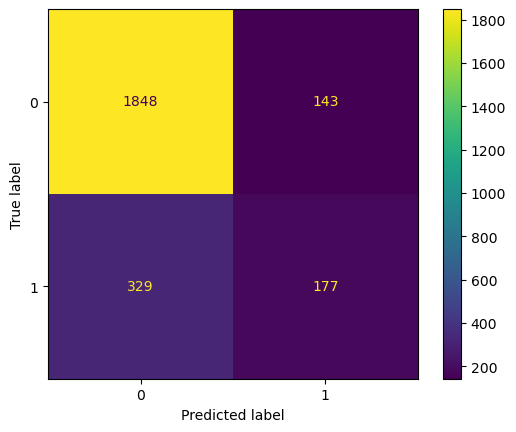

In [76]:
conf_matrix_plot(gnb_scaled, X_test, y_test)

All of our model metrics can be derived from the confusion matrix, and each metric tells its own part of the story. What stands out most in the confusion matrix is that the model misses a lot of customers who will churn. In other words, there are a lot of false negatives&mdash;355, to be exact. This is why our recall score is only 0.303. 
